In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [29]:
# simple 2-dimensional gaussian splats for starters
means = [
    (0, 0),
    (2, 2),
    (-1, 1)
]

covariances = [
    [[0.2, 0], [0, 0.2]],
    [[0.5, 0.3], [0.3, 0.5]],
    [[0.3, -0.2], [-0.2, 0.3]]
]

num_samples_per_cluster = 50

In [44]:
cluster_labels = [str(i) for i in range(len(means)) for _ in range(num_samples_per_cluster)]
dataset = np.asarray([np.random.multivariate_normal(mean, cov, size=num_samples_per_cluster) for mean, cov in zip(means, covariances)])
dataset = np.vstack(dataset)

df = pd.DataFrame({'x': dataset[:, 0], 'y': dataset[:, 1], 'cluster': cluster_labels})
df

,x,y,cluster
0,-0.231182,0.402940,0
1,-0.340904,0.104345,0
2,-0.003696,-0.416029,0
3,-0.382055,0.723930,0
4,0.277271,-0.785083,0
...,...,...,...
145,-1.753970,1.051819,2
146,-0.854667,1.034006,2
147,-0.932216,0.759148,2
148,0.048097,0.409989,2


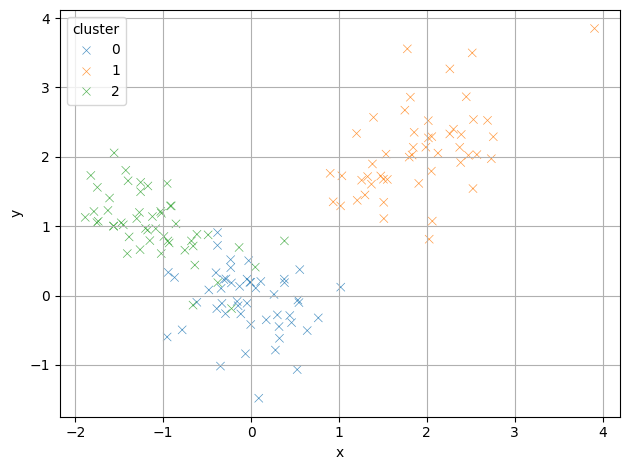

In [45]:
sns.scatterplot(df, x = 'x', y = 'y', hue = 'cluster', alpha = 0.8, marker = 'x')
plt.grid()
plt.tight_layout()

# Diffusion model - forward pass

In a diffusion model, we first make a forward pass by adding some noise to our original dataset.  

More specifically, at step $t$, we should have a sample generated from the diffusion model 

$$
\text{d}X_t = f(X_t, t) \text{d} t + g(t)\text{d}B_t
$$

for a drift function $f: \mathbb{R}^d \times \mathbb{R}^+ \to \mathbb{R}^d$ and diffusion function $g: \mathbb{R}^+ \to \mathbb{R}^+$.  

## Discretization

Of course in practice, we discretize the steps as being $t = 0, \Delta t, 2\Delta t, \dots, T$ for some final time $T$ and even spacing $\Delta t$.  
For simplicity in this example, we set the drift function to simply be a small scale down, $f(X_t, t) = -\lambda X_t$.
We set the diffusion term to be just a constant $g(t) = \sigma, \sigma \gt 0$.  
Then, the discretization rule becomes

$$
X_{t + \Delta t} = X_t -\lambda X_t \Delta t + \sigma \sqrt{\Delta t} \epsilon 
$$

where $\epsilon \sim \mathcal{N}(0, \mathbf{I})$ is a multivariate standard gaussian.

In [49]:
T = 5
delta_t = 0.01
N_t = int(T / delta_t)
lambda_coeff = 0.2
sigma = 0.5
t_range = np.linspace(delta_t, T, N_t) # Starting from the first non-zero timestamp
print(f"T array shape: {t_range.shape}")

T array shape: (500,)


In [50]:
# Compute the discretized forward pass
X_t = [dataset.copy()]
X_curr = X_t[0]
for i, t in enumerate(t_range):
    X_tnew = X_curr -lambda_coeff * X_t[i] * delta_t + sigma * np.sqrt(delta_t) * np.random.normal(0, 1, size = X_curr.shape)
    X_t.append(X_tnew)
    X_curr = X_tnew
X_t = np.asarray(X_t)
X_t.shape

(501, 150, 2)

In [85]:
# Also here the Kullback-Leibner divergence to a standard gaussian
def kl_to_standard_normal(mu, cov):
    d = mu.shape[0]
    trace_term = np.trace(cov)
    quad_term = mu @ mu
    logdet_term = np.log(np.linalg.det(np.eye(d)) / np.linalg.det(cov))
    return 0.5 * (trace_term + quad_term - d + logdet_term)

distances = []
for X in X_t:
    means = np.mean(X, axis = 0)
    cov = np.cov(X.T)
    kl_distance = kl_to_standard_normal(mu = means, cov = cov)
    distances.append(kl_distance)
distances = np.asarray(distances)
distances.shape

(501,)

### Visualization of a simple diffusion process

In [90]:
from IPython.display import HTML
import matplotlib.animation as animation

fig, axis = plt.subplots(1, 2, figsize=(8, 6))
ax = axis[0]
scat = ax.scatter([], [], s=5)
cmap = plt.get_cmap('tab10')
colors = [cmap(label) for label in map(int, cluster_labels)]

def init():
    ax.set_xlim(-5, 5)
    ax.set_ylim(-5, 5)
    ax.set_title("Evolution of diffusion process $X_t$")
    ax.set_ylabel('$y$')
    ax.set_xlabel('$x$')
    return scat,

def update(frame):
    scat.set_offsets(X_t[frame])
    scat.set_color(colors)
    ax.set_title(f"t = {t_range[frame]:.2f}")
    return scat,

ani = animation.FuncAnimation(fig, update, frames=X_t.shape[0] - 1, init_func=init,
                              interval=100, blit=True)
plt.close(fig)
HTML(ani.to_jshtml())

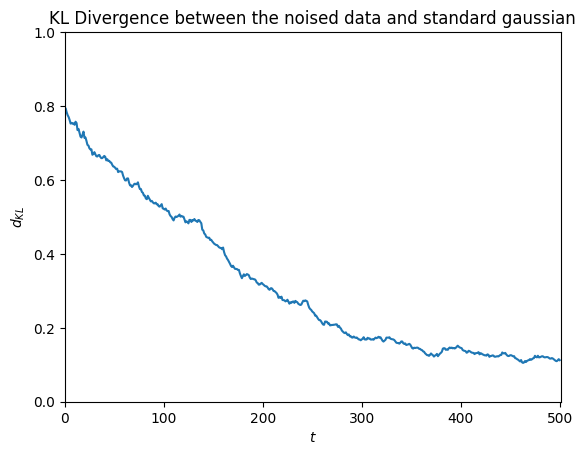

In [96]:
# Visualize the KL divergence
sns.lineplot(distances).set(
    title = 'KL Divergence between the noised data and standard gaussian', 
    xlabel = '$t$', 
    ylabel = '$d_{KL}$', 
    xlim=(0, len(X_t)),
    ylim=(0, 1)
);

From the plot above, we can note that the Kullbeck-Leibner divergence has a clear decreasing trend. This corresponds to the fact that as the process continues, the likely distribution of samples tends towards a standard gaussian. In other words, the diffuse process destroys the information contained in the original more structured dataset $X_0$.

## Analytical expression for distribution

For a this simple diffusion process $X_t$ we can derive an analytical distribution for each time $t \gt 0$.  

$$
\boxed{
X_t \sim \mathcal{N} \left( e^{-\lambda t} X_0,\; \frac{\sigma^2}{2\lambda} \left( 1 - e^{-2\lambda t} \right) I \right)
}
$$

Using this expression, we can generate new samples at each timestep without having to trace an entire path numerically.  
This will be useful later on as we use machine learning to reverse the process. Below we implement the code for drawing these samples and also visualize some of the points generated.

In [62]:
def generate_diffusion_sample(t: float, X_0: np.ndarray, lambda_coeff: float, sigma: float, size: int = 1):
    decay = np.exp(-lambda_coeff * t)
    std = np.sqrt((sigma**2) / (2 * lambda_coeff) * (1 - np.exp(-2 * lambda_coeff * t)))
    mean = decay * X_0
    noise = np.random.normal(loc=0.0, scale=std, size=X_0.shape)
    return mean + noise

In [114]:
example_times = [0.1, 1.0, T - 0.001]
generated_sample_examples = [generate_diffusion_sample(t, X_0 = X_t[0], lambda_coeff = lambda_coeff, sigma = sigma) for t in example_times]

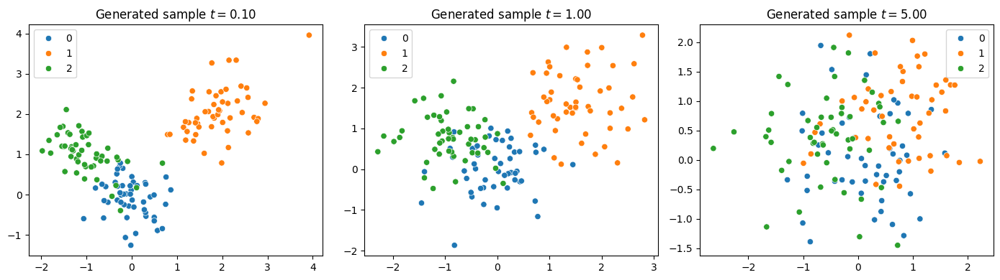

In [115]:
fig, ax = plt.subplots(1, 3, figsize=(14, 4))
for i in range(len(ax)):
    samples = generated_sample_examples[i]
    sns.scatterplot(x = samples[:, 0], y = samples[:, 1], hue = cluster_labels, ax = ax[i]).set(title = f'Generated sample $t = {example_times[i]:.2f}$')
plt.tight_layout()

# Appendix (Optional): Deriving the Fokker-Planck Equation — Step by Step

Let’s take a careful look at how the Fokker-Planck equation arises from a diffusion process defined by the stochastic differential equation (SDE)

$$
dX_t = f(X_t, t) \, dt + g(t) \, dB_t,
$$

where $X_t$ is a $d$-dimensional stochastic process, $f$ is a drift term, $g(t)$ is a scalar diffusion coefficient, and $B_t$ is standard Brownian motion in $\mathbb{R}^d$.

## The Assumptions We Need

We assume:
- The drift $f(x, t)$ and diffusion coefficient $g(t)$ are bounded, continuous, and Lipschitz in $x$,
- The SDE admits a unique strong solution $X_t$,
- The law of $X_t$ admits a smooth probability density $p(x, t)$ with respect to Lebesgue measure,
- We work with smooth test functions $\phi(x)$ of compact support.

These assumptions ensure that all the differential, expectation, and integration operations we use are mathematically justified.

---

## Applying Itô’s Formula

We begin with Itô’s formula applied to $\phi(X_t)$:

$$
d\phi(X_t) = \nabla_x \phi(X_t)^\top f(X_t, t) \, dt + \frac{1}{2} g^2(t) \, \Delta \phi(X_t) \, dt + \nabla_x \phi(X_t)^\top g(t) \, dB_t.
$$

We then integrate both sides over time from $0$ to $t$:

$$
\phi(X_t) = \phi(X_0) + \int_0^t \nabla_x \phi(X_s)^\top f(X_s, s) \, ds + \frac{1}{2} \int_0^t g^2(s) \, \Delta \phi(X_s) \, ds + \int_0^t \nabla_x \phi(X_s)^\top g(s) \, dB_s.
$$

---

## Taking Expectations

Taking expectations eliminates the stochastic integral (its expectation is zero), giving

$$
\mathbb{E}[\phi(X_t)] = \mathbb{E}[\phi(X_0)] + \int_0^t \mathbb{E} \left[ \nabla_x \phi(X_s)^\top f(X_s, s) \right] ds + \frac{1}{2} \int_0^t g^2(s) \, \mathbb{E} \left[ \Delta \phi(X_s) \right] ds.
$$

---

## Differentiating with Respect to Time

Differentiating both sides with respect to $t$, we obtain

$$
\frac{d}{dt} \mathbb{E}[\phi(X_t)] = \mathbb{E} \left[ \nabla_x \phi(X_t)^\top f(X_t, t) \right] + \frac{1}{2} g^2(t) \, \mathbb{E} \left[ \Delta \phi(X_t) \right].
$$

---

## Expressing Expectations as Integrals over the Density

Since $X_t$ has density $p(x, t)$, we can write

$$
\mathbb{E}[\phi(X_t)] = \int_{\mathbb{R}^d} \phi(x) \, p(x, t) \, dx.
$$

Substituting this into our differentiated expression gives

$$
\frac{d}{dt} \int_{\mathbb{R}^d} \phi(x) \, p(x, t) \, dx = \int_{\mathbb{R}^d} \nabla_x \phi(x)^\top f(x, t) \, p(x, t) \, dx + \frac{1}{2} g^2(t) \int_{\mathbb{R}^d} \Delta \phi(x) \, p(x, t) \, dx.
$$

---

## Integration by Parts — Moving Derivatives to $p(x, t)$

Using integration by parts and assuming $\phi$ has compact support:

- The drift term becomes

$$
\int \nabla_x \phi(x)^\top f(x, t) \, p(x, t) \, dx = - \int \phi(x) \, \nabla_x \cdot \left( f(x, t) \, p(x, t) \right) \, dx.
$$

- The diffusion term becomes

$$
\int \Delta \phi(x) \, p(x, t) \, dx = \int \phi(x) \, \Delta p(x, t) \, dx.
$$

---

## The Weak Form of the Fokker-Planck Equation

We now have

$$
\frac{d}{dt} \int \phi(x) \, p(x, t) \, dx = \int \phi(x) \left( - \nabla_x \cdot (f p) + \frac{1}{2} g^2(t) \, \Delta p \right) dx.
$$

Since this holds for arbitrary smooth test functions $\phi(x)$, the **strong form** of the **Fokker-Planck equation** follows:

$$
\frac{\partial p}{\partial t} = - \nabla_x \cdot (f p) + \frac{1}{2} g^2(t) \, \Delta p.
$$

This describes how probability mass evolves over time — the drift moves it deterministically, while the diffusion spreads it out due to randomness.


# Implementing reversed SDE

Now we have seen how the time-reversed diffusion process is theoretically derived. The main term of interest is the score function $\log \nabla_x p(x)$ which is used to reverse the drift of the stochastic process. However, in practice we do not have an analytic expression for the score function but rather we must learn it from data.

In the next section, we will build a machine learning architecture for modeling the score function. Later on, we will use the learned score function to draw new samples from the original data distribution. We can then generate new samples which have similar distribution to the original data. Finally, we visualize the distributions of the new samples and compare them to the original dataset and see how we have generated similar samples from just gaussian noise!

In [52]:
import torch
from torch.utils.data import IterableDataset, DataLoader

# Generate samples from the forward process
def sample_xt_and_score(x0_batch, t_batch, lambda_coeff, sigma):
    exp_factor = torch.exp(-lambda_coeff * t_batch)  # shape (batch_size, 1)
    mean = exp_factor * x0_batch
    var = (sigma ** 2) / (2 * lambda_coeff) * (1 - exp_factor ** 2)  # shape (batch_size, 1)
    std = torch.sqrt(var)

    epsilon = torch.randn_like(x0_batch)
    xt = mean + std * epsilon

    score_target = -(xt - mean) / var  # (batch_size, 2)

    return xt, score_target


# Dataset implementation
class DiffusionDataIterator(IterableDataset):
    def __init__(self, x0_data, lambda_coeff, sigma):
        super().__init__()
        self.x0_data = torch.tensor(x0_data, dtype=torch.float32)
        self.lambda_coeff = lambda_coeff
        self.sigma = sigma

    def __iter__(self):
        while True:
            idx = torch.randint(0, self.x0_data.size(0), (1,)).item()
            x0 = self.x0_data[idx]
            t = torch.rand(1)
            xt, score = sample_xt_and_score(x0.unsqueeze(0), t.unsqueeze(0), self.lambda_coeff, self.sigma)
            yield xt.squeeze(0), t, score.squeeze(0)


In [59]:
# Instantiate the dataset and dataloader
dataset = DiffusionDataIterator(X_t, lambda_coeff = lambda_coeff, sigma = sigma)
dataloader = DataLoader(dataset, batch_size=512, num_workers=2)

### Score learning network

Here we have a simple 2 layer fully-connected MLP network for learning the score function $s_\theta(x, t)$.  
Each sample we give the network is a vector $(x, y, t)^T$ and we optimize the network to minimize the difference in the probability gradient

TODO: Here equation for the score optimization
$$

$$

In [40]:
# Implementation of the neural network for learning the score
import torch.nn as nn
class SimpleScoreNet(nn.Module):
    def __init__(self, hidden_dim=64):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(3, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 2)
        )

    def forward(self, x, t):
        t_embed = torch.ones_like(x[:, :1]) * t  # (batch_size, 1)
        inp = torch.cat([x, t_embed], dim=1)
        return self.net(inp)


In [41]:
# Training loop

